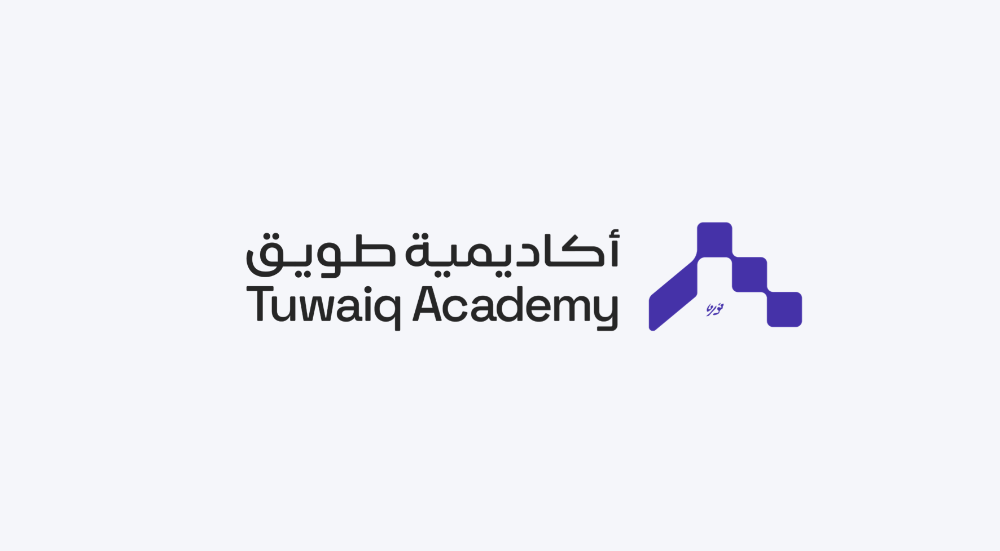

# Assignment 1: Submit a write-up on the following:


### • Hugging face agents :

Agent that leverages natural language to choose a tool from a curated collection of tools and accomplish various tasks.

### • Hugging face pipeline for text generation :
Language generation pipeline. This pipeline predicts the words that will follow a specified text prompt. which case the pipeline will operate in chat mode and will continue the chats by adding its response. Each chat takes the form of a list of dicts, where each dict contains "role" and "content" keys.

### • HF inference endpoints :
Inference Endpoints offers a solution to deploy any users models managed by Hugging Face .

### • Give feedback on the image generation and explore different models available on the Hugging Face website :

Image generation involves creating visual content from text descriptions , The model effectively captures the requested features and style, producing visually appealing results.

-- Here are the top models on Hugging Face for image generation :

• runwayml/stable-diffusion-v1-5 :
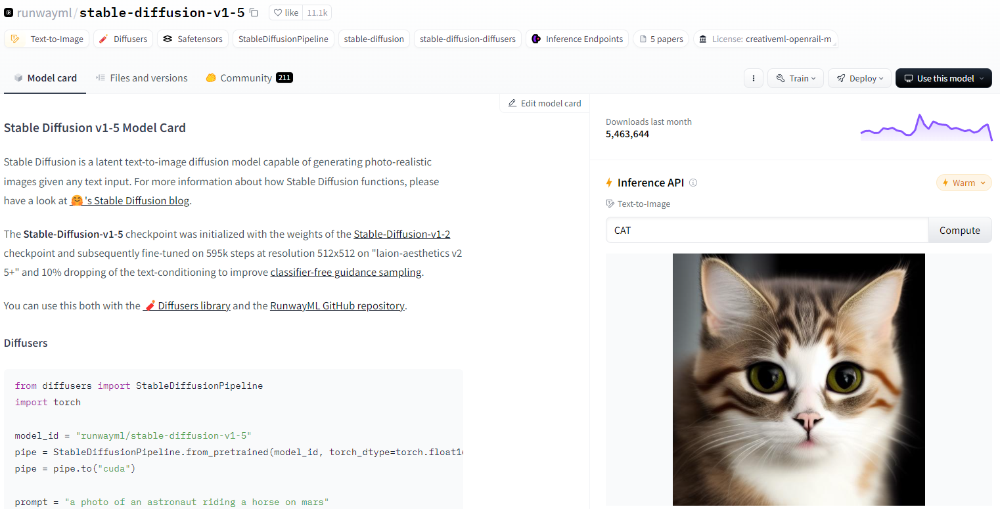

• stabilityai/stable-diffusion-2-1-base :
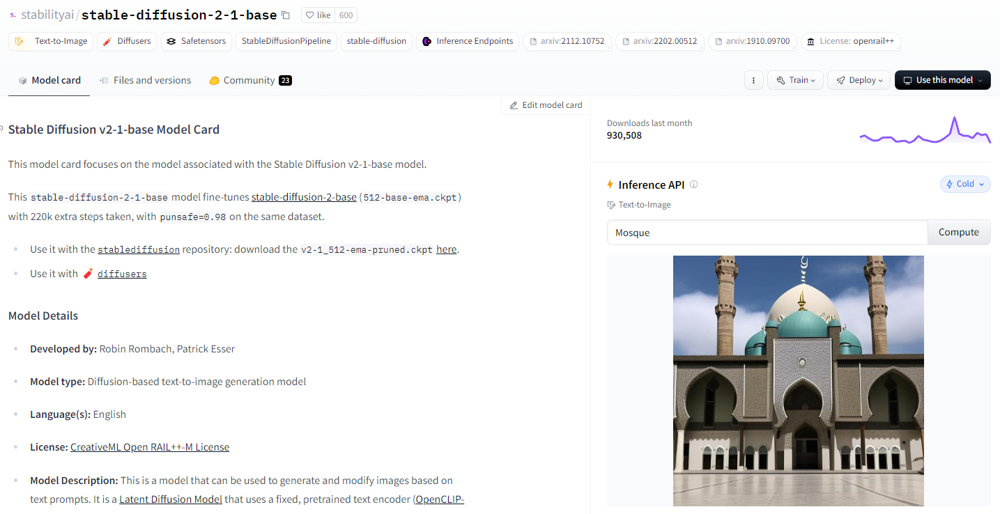

------

# Assignment 2: Using OpenAI's CLIP Model for Image Captioning and Building an Image Search Engine

## Part 1: Generate Captions for Images

### • Load The model

In [3]:
from transformers import BlipProcessor, BlipForConditionalGeneration

model = BlipForConditionalGeneration.from_pretrained('Salesforce/blip-image-captioning-base')
processor = BlipProcessor.from_pretrained('Salesforce/blip-image-captioning-base')

preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

### • Load images

Number of Images : 15


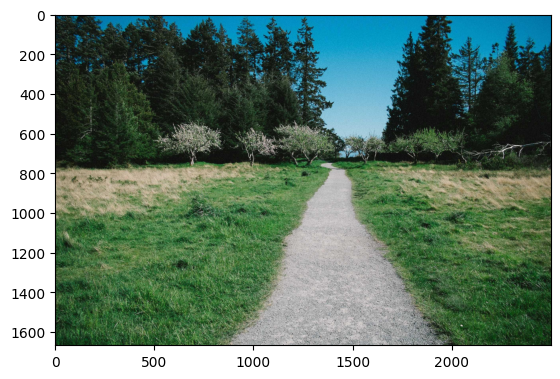

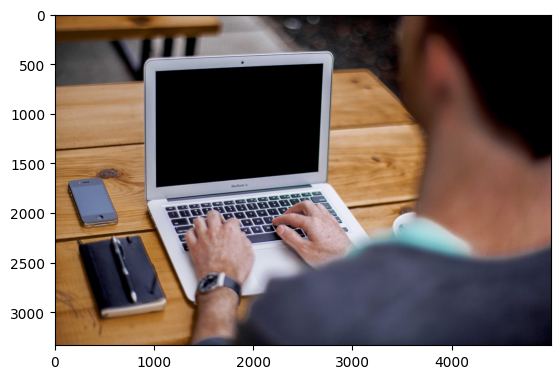

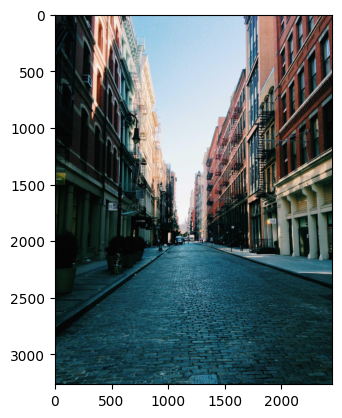

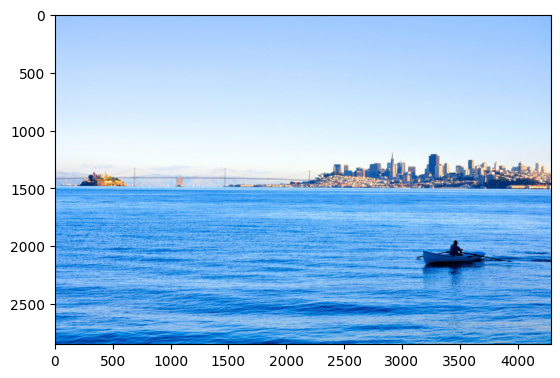

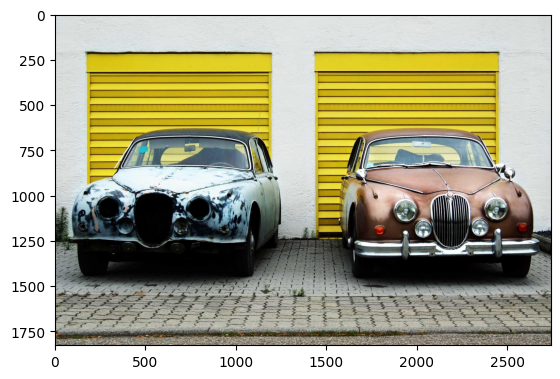

...

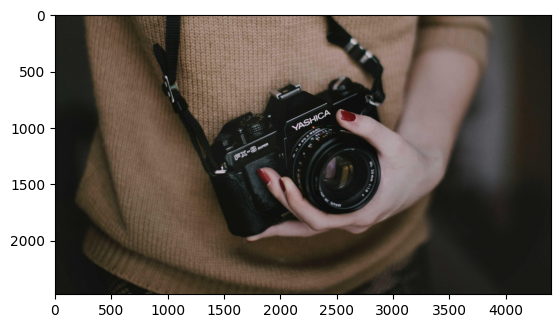

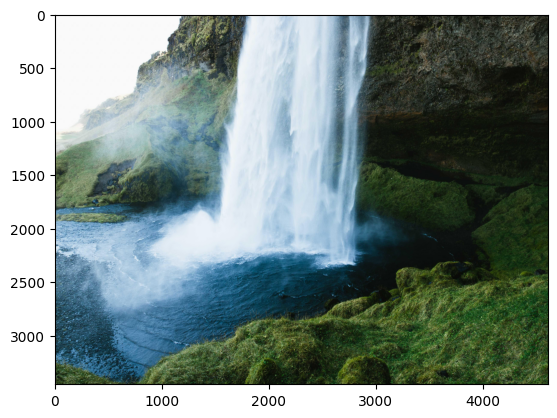

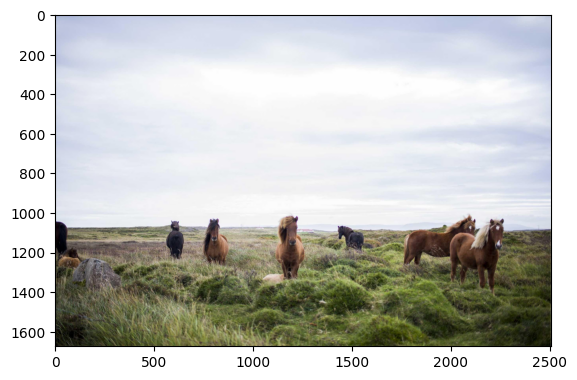

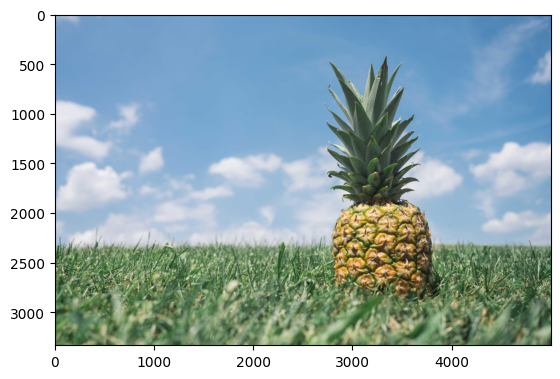

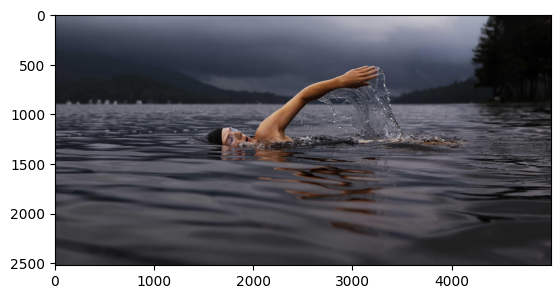

In [5]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import requests

urls = [
    "https://picsum.photos/id/17/2500/1667",
    "https://picsum.photos/id/5/5000/3334",
    "https://picsum.photos/id/57/2448/3264",
    "https://picsum.photos/id/74/4288/2848",
    "https://picsum.photos/id/133/2742/1828",
    "https://picsum.photos/id/197/4272/2848",
    "https://picsum.photos/id/219/5000/3333",
    "https://picsum.photos/id/274/3824/2520",
    "https://picsum.photos/id/292/3852/2556",
    "https://picsum.photos/id/364/5000/2917",
    "https://picsum.photos/id/454/4403/2476",
    "https://picsum.photos/id/509/4608/3456",
    "https://picsum.photos/id/584/2507/1674",
    "https://picsum.photos/id/824/5000/3333",
    "https://picsum.photos/id/841/5000/2522"

]
print(f'Number of Images : {len(urls)}')
images = [
    Image.open(requests.get(url, stream=True).raw) for url in urls]

for image in images:
    plt.show(plt.imshow(np.asarray(image)))

### • Generate Captions

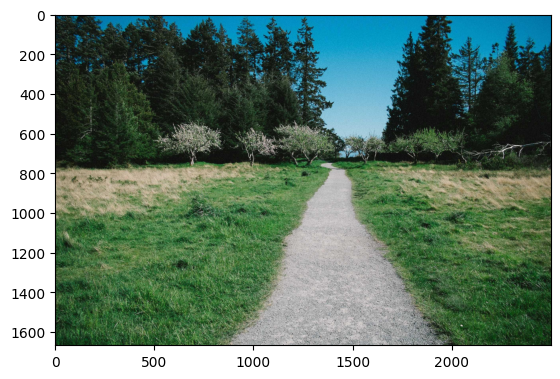

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1249: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


a path through a grassy field with trees


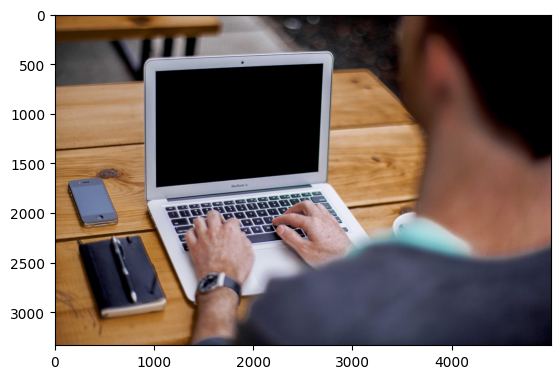

a man is typing on a laptop computer


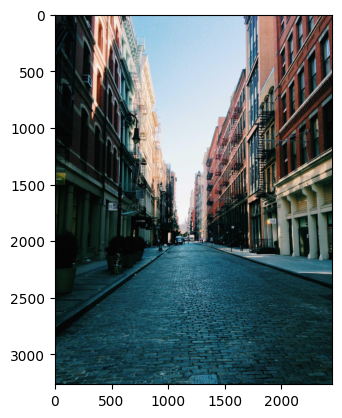

a cobbed street in the city of boston


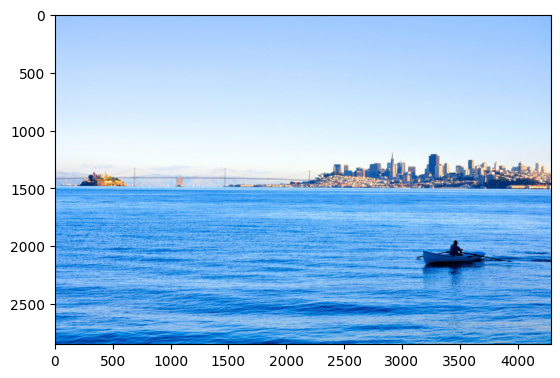

a man in a boat in the water with a city skyline in the background


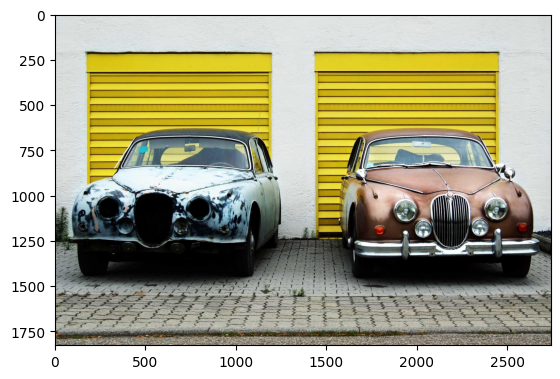

two old cars parked next to each other cars


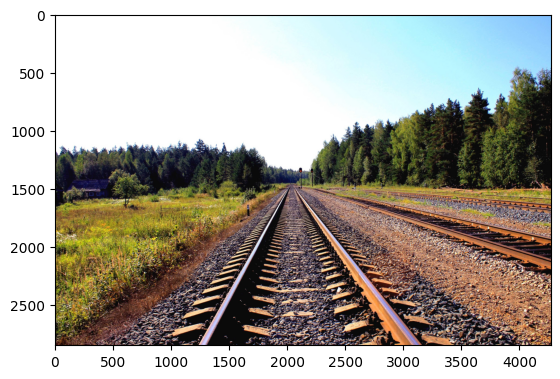

a train track with a few trees in the background


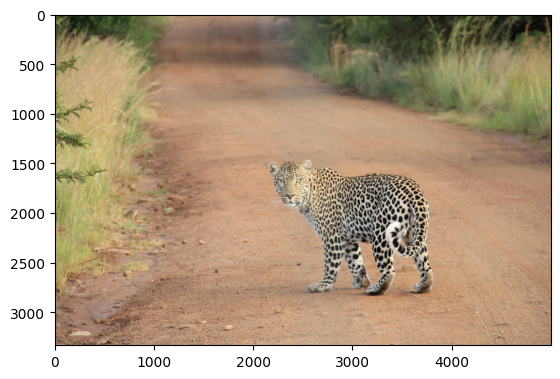

a leopard walking down a dirt road


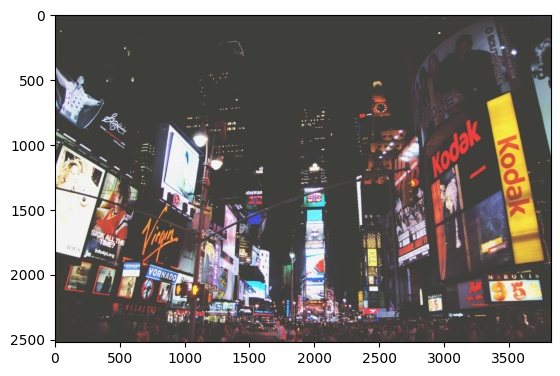

a city street filled with lots of people


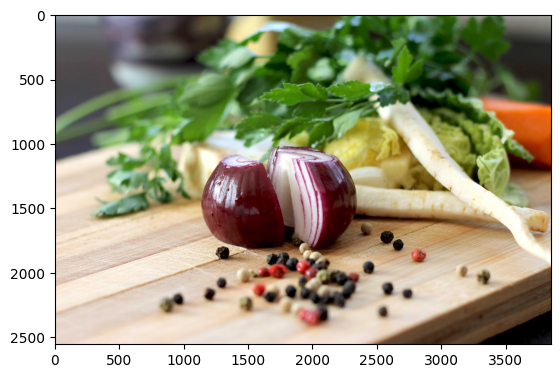

a cutting board with a bunch of vegetables on it


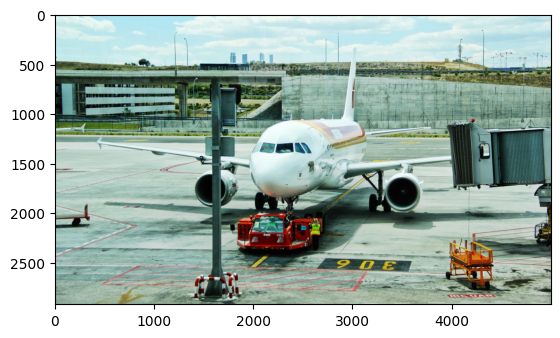

a plane parked on the tarmac


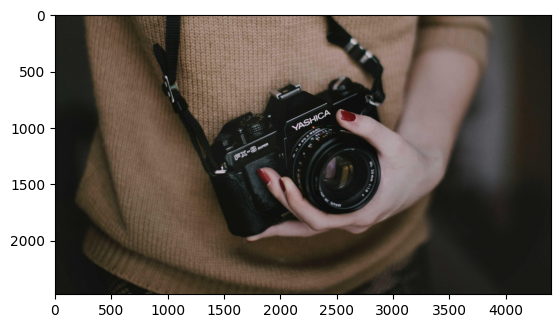

a woman holding a camera in her hands


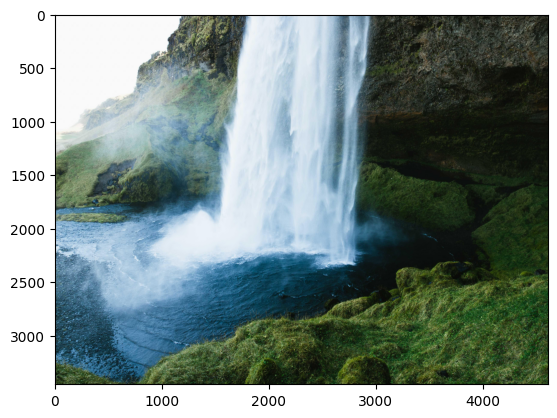

a waterfall in iceland


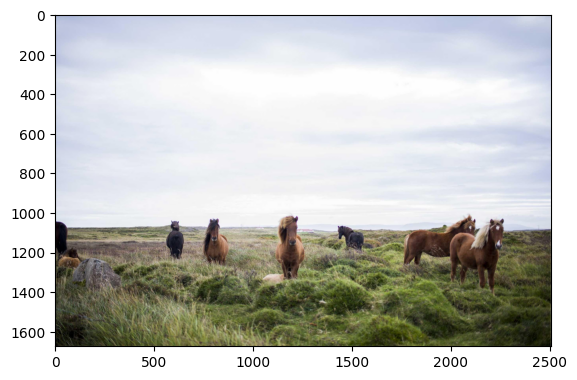

a group of horses standing in a field


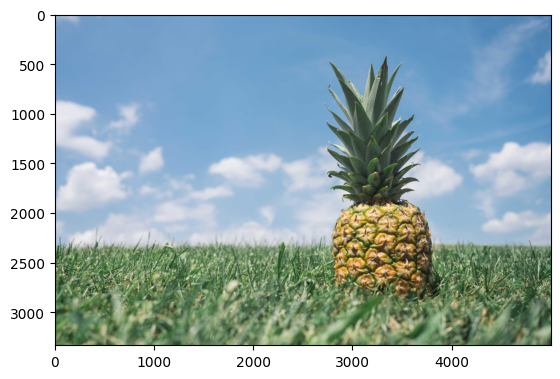

a pineapple on a green grass field


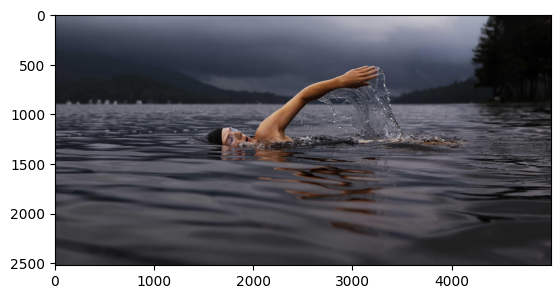

a woman swimming in the water


In [8]:
for url in urls:

  image = Image.open(requests.get(url, stream=True).raw)
  plt.show(plt.imshow(np.asarray(image)))

  inputs = processor(image, return_tensors="pt")
  out = model.generate(**inputs)

  print(processor.decode(out[0], skip_special_tokens=True))

## Part 2: Build an Image Search Engine

In [3]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import requests

urls = [
    "https://picsum.photos/id/17/2500/1667",
    "https://picsum.photos/id/5/5000/3334",
    "https://picsum.photos/id/57/2448/3264",
    "https://picsum.photos/id/74/4288/2848",
    "https://picsum.photos/id/133/2742/1828",
    "https://picsum.photos/id/197/4272/2848",
    "https://picsum.photos/id/219/5000/3333",
    "https://picsum.photos/id/274/3824/2520",
    "https://picsum.photos/id/292/3852/2556",
    "https://picsum.photos/id/364/5000/2917",
    "https://picsum.photos/id/454/4403/2476",
    "https://picsum.photos/id/509/4608/3456",
    "https://picsum.photos/id/584/2507/1674",
    "https://picsum.photos/id/824/5000/3333",
    "https://picsum.photos/id/841/5000/2522"
]

images = [
    Image.open(requests.get(url, stream=True).raw) for url in urls]

In [1]:
from transformers import CLIPProcessor, CLIPModel

model = CLIPModel.from_pretrained('openai/clip-vit-base-patch32')
processor = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')

c:\Users\azoze\AppData\Local\Programs\Python\Python39\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\azoze\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
c:\Users\azoze\AppData\Local\Programs\Python\Python39\lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [4]:
captions = ["plane"]
inputs = processor(
    text=captions, images=images,
    return_tensors='pt', padding=True
)

outputs = model(**inputs)

probs = outputs.logits_per_image.argmax()
probs

tensor(9)

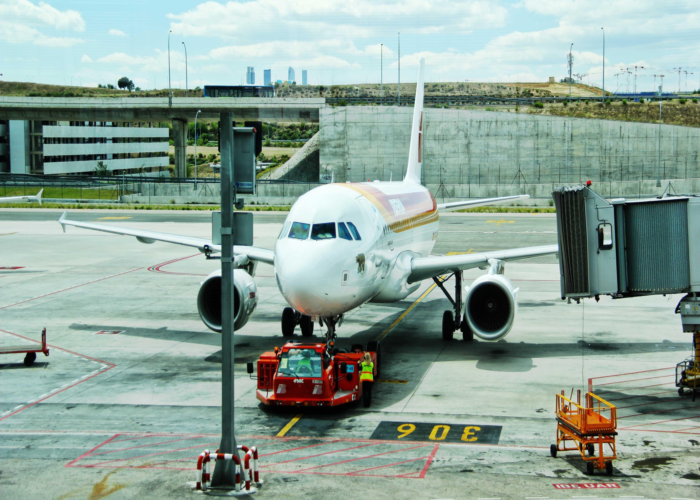

In [5]:
images[probs.item()].resize((700, 500), Image.Resampling.BILINEAR) 